<a href="https://colab.research.google.com/github/satuelisa/CINVESTAV2025/blob/main/appl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

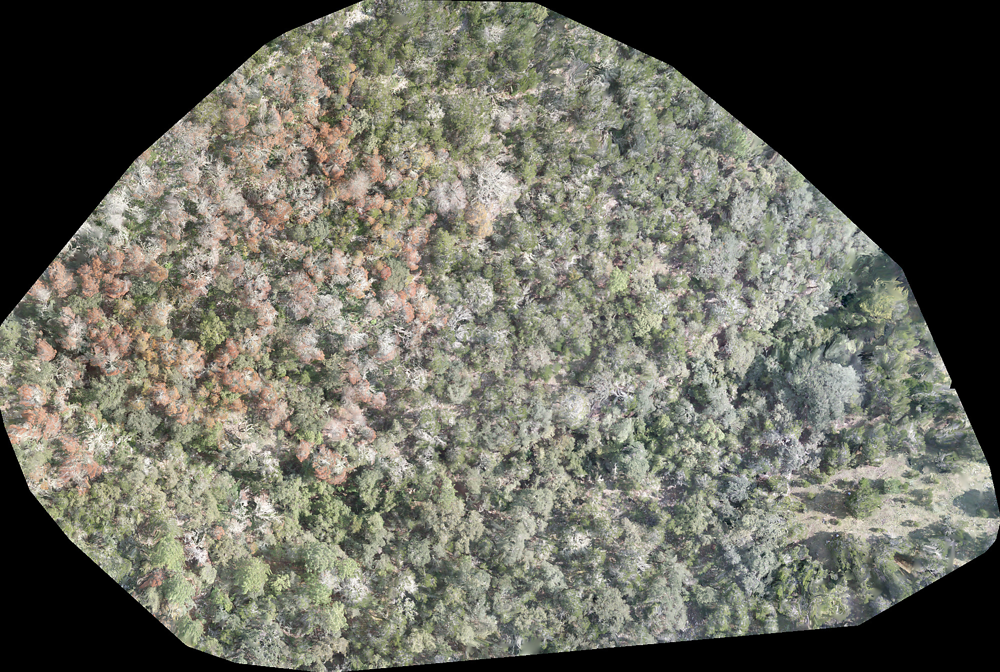

In [1]:
from PIL import Image
import requests
source = 'https://github.com/SCS-Technology-and-Innovation/DACS/blob/main/DTDA/img/canopy.jpg?raw=true'
whole = Image.open(requests.get(source, stream = True).raw)
display(whole)

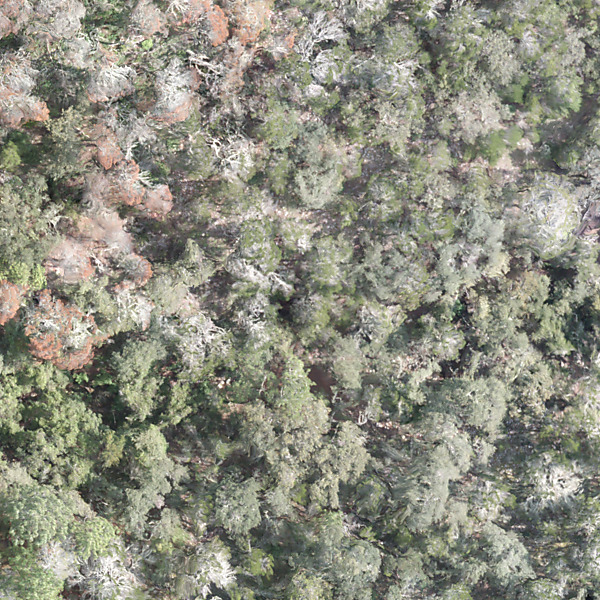

(600, 600)


In [8]:
bb = (600, 600, 1200, 1200) # just a rectangle from "the inside"
trees = whole.crop(bb)
display(trees)
print(trees.size)

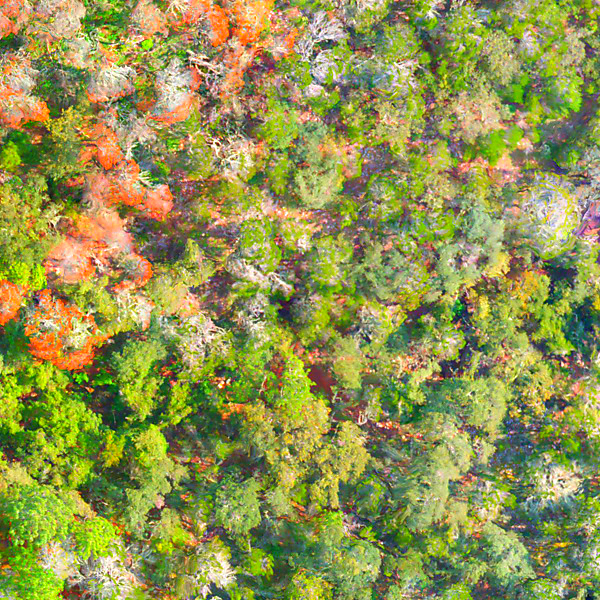

In [9]:
from PIL import ImageEnhance
saturation = ImageEnhance.Color(trees)
factor = 5
saturated = saturation.enhance(factor)
display(saturated)

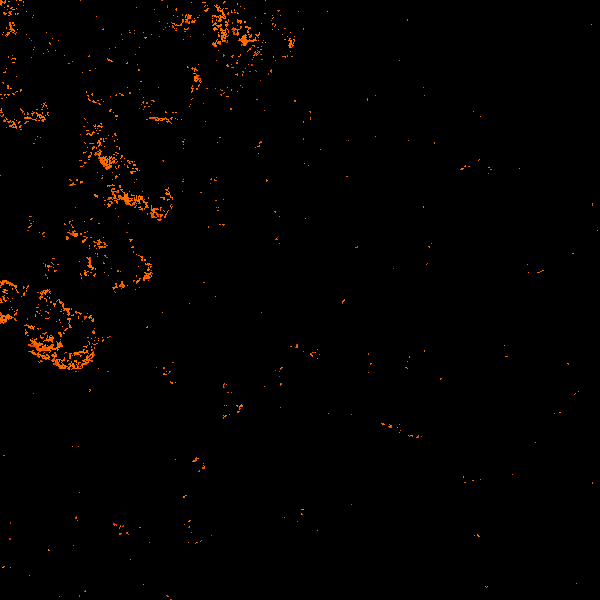

In [10]:
reds = saturated.copy()
pixels = reds.load()
w, h = reds.size
threshold = 200
for row in range(h):
  for column in range(w):
    (red, green, blue) = pixels[column, row]
    if red > threshold and red > 2 * green and red > 2 * blue:
      pixels[column, row] = (red, green, 0) # ditch the blue channel
    else:
      pixels[column, row] = (0, 0, 0) # black if red not dominant
display(reds)

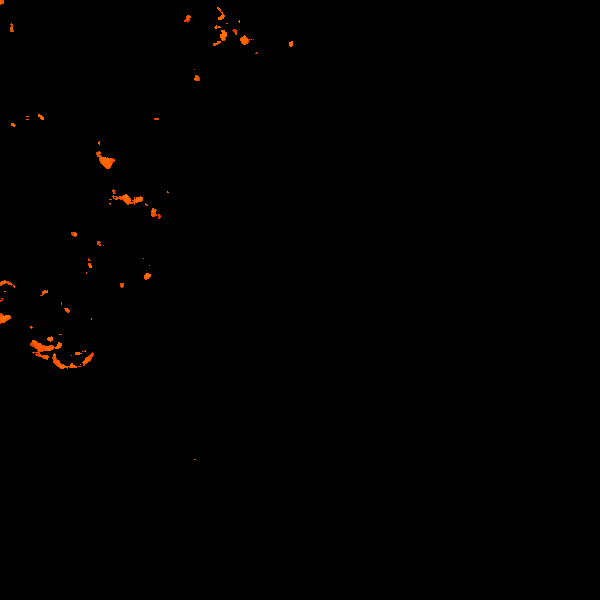

In [12]:
from PIL import ImageFilter
median = reds.filter(ImageFilter.MedianFilter(size = 5))
display(median)

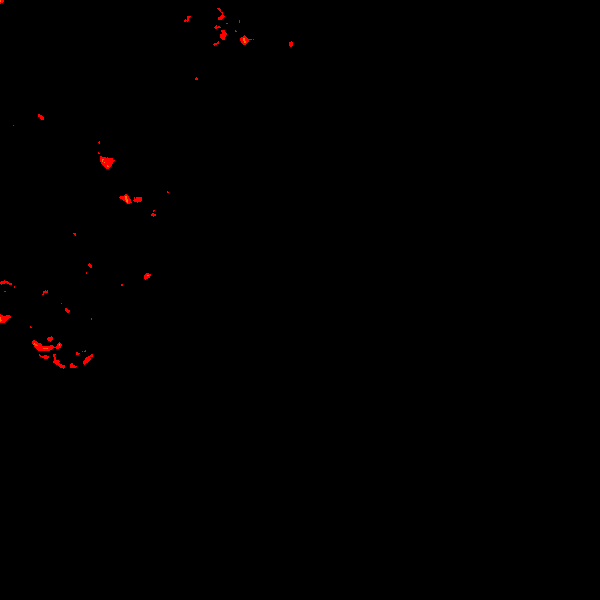

In [14]:
mode = reds.filter(ImageFilter.ModeFilter(size = 5))
display(mode)

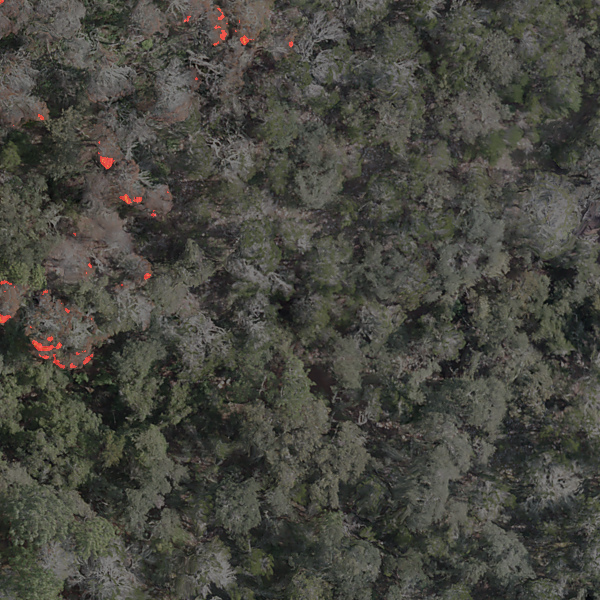

In [15]:
trees = trees.convert('RGB')
overlay = Image.blend(trees, mode, 0.5) # try the median, too
display(overlay)

In [16]:
!pip install -q opencv-python

In [18]:
import numpy as np
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow # colab is special

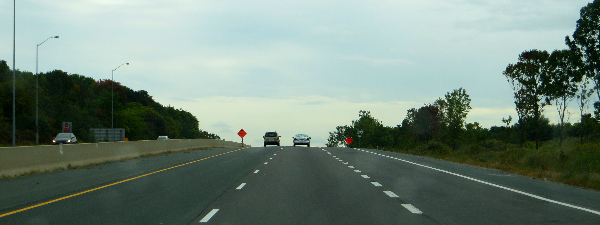

In [20]:
from urllib.request import urlopen
src = 'https://upload.wikimedia.org/wikipedia/commons/3/35/Ontario_Highway_401%2C_Near_Colbourne%2C_Ontario_%2829985970881%29.jpg'
req = urlopen(src)
arr = np.asarray(bytearray(req.read()), dtype = np.uint8)
img = cv2.imdecode(arr, -1)
oh, ow, ch = img.shape
width = 600
height = None # the original photo is 4k pixels wide, which is very slow to process
if ow > width:
  ratio = oh / ow
  height = round(ratio * width)
  img = cv2.resize(img, (width, height)) # keep the aspect ratio
else:
  width = ow
  height = oh
cv2_imshow(img)

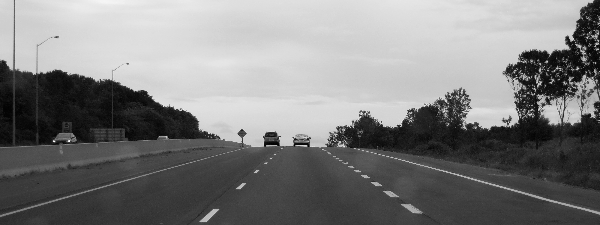

In [21]:
gr = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gr)

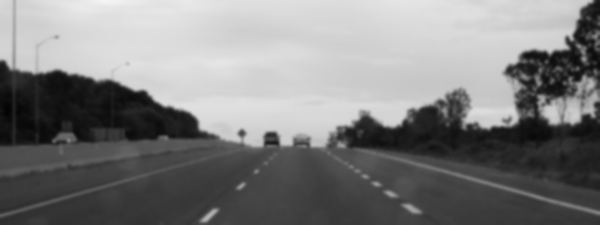

In [22]:
blur = cv2.GaussianBlur(gr, (7, 7), 0) # noise reduction
cv2_imshow(blur)

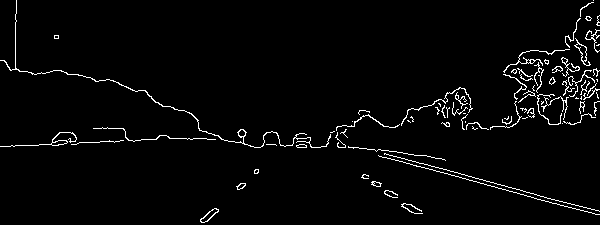

In [23]:
edges = cv2.Canny(blur, 50, 150)
cv2_imshow(edges)

In [28]:
!pip install gutenbergpy

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 22.0 MB/s eta 0:00:00
  Created wheel for httpsproxy-urllib2: filename=httpsproxy_urllib2-1.0-py3-none-any.whl size=29251 sha256=bcd780de6868b7cdc7e5b7c132a293c4fd85a90ec3e0dfd888988d0ae3b688f9
  Stored in directory: /root/.cache/pip/wheels/e6/5c/6b/790df3d7037e3d9aaf7a48d563626941f2f60198d2f1eef8d2
Successfully built httpsproxy-urllib2


In [29]:
target = 1342 # pride and prejudice
import gutenbergpy.textget
raw  = gutenbergpy.textget.get_text_by_id(target) # access the book content
content = gutenbergpy.textget.strip_headers(raw) # remove header metadata
text = content.decode("utf-8") # encoding of the content

                      Jane Austen,

                           with a Preface by
                           George Saintsbury
                                  and
                           Illustrat


In [38]:
fragment = text[55000:56000]
print(fragment) # let's see some of it

 you like this man’s sisters,
too, do you? Their manners are not equal to his.”

“Certainly not, at first; but they are very pleasing women when you
converse with them. Miss Bingley is to live with her brother, and keep
his house; and I am much mistaken if we shall not find a very charming
neighbour in her.”

Elizabeth listened in silence, but was not convinced: their behaviour at
the assembly had not been calculated to please in general; and with more
quickness of observation and less pliancy of temper than her sister, and
with a judgment, too, unassailed by any attention to herself, she was
very little disposed to approve them. They were, in fact, very fine
ladies; not deficient in good-humour when they were pleased, nor in the
power of being agreeable where they chose it; but proud and conceited.
They were rather handsome; had been educated in one of the first private
seminaries in town; had a fortune of twenty thousand pounds; were in the
habit of spending more than they ought, and

In [41]:
from string import punctuation
import re # regular expressions
from string import printable

print('Allow these:', printable)
forbid = f'[^{re.escape(printable)}]' # everything else must go

removed = fragment.translate(str.maketrans(punctuation, ' ' * len(punctuation))) # substitute with space
better = re.sub(forbid, ' ', removed)
clean = re.compile(r'\s+')
ok = clean.sub(' ', better) # remove repeated spaces
print(ok)

Allow these: 0123456789abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~ 	

 you like this man s sisters too do you Their manners are not equal to his Certainly not at first but they are very pleasing women when you converse with them Miss Bingley is to live with her brother and keep his house and I am much mistaken if we shall not find a very charming neighbour in her Elizabeth listened in silence but was not convinced their behaviour at the assembly had not been calculated to please in general and with more quickness of observation and less pliancy of temper than her sister and with a judgment too unassailed by any attention to herself she was very little disposed to approve them They were in fact very fine ladies not deficient in good humour when they were pleased nor in the power of being agreeable where they chose it but proud and conceited They were rather handsome had been educated in one of the first private seminaries in town had a fortune 

In [42]:
words = ok.split()

def keep(word):
  return not word.isupper()

good = list(filter(keep, words))
print(good)

['you', 'like', 'this', 'man', 's', 'sisters', 'too', 'do', 'you', 'Their', 'manners', 'are', 'not', 'equal', 'to', 'his', 'Certainly', 'not', 'at', 'first', 'but', 'they', 'are', 'very', 'pleasing', 'women', 'when', 'you', 'converse', 'with', 'them', 'Miss', 'Bingley', 'is', 'to', 'live', 'with', 'her', 'brother', 'and', 'keep', 'his', 'house', 'and', 'am', 'much', 'mistaken', 'if', 'we', 'shall', 'not', 'find', 'a', 'very', 'charming', 'neighbour', 'in', 'her', 'Elizabeth', 'listened', 'in', 'silence', 'but', 'was', 'not', 'convinced', 'their', 'behaviour', 'at', 'the', 'assembly', 'had', 'not', 'been', 'calculated', 'to', 'please', 'in', 'general', 'and', 'with', 'more', 'quickness', 'of', 'observation', 'and', 'less', 'pliancy', 'of', 'temper', 'than', 'her', 'sister', 'and', 'with', 'a', 'judgment', 'too', 'unassailed', 'by', 'any', 'attention', 'to', 'herself', 'she', 'was', 'very', 'little', 'disposed', 'to', 'approve', 'them', 'They', 'were', 'in', 'fact', 'very', 'fine', 'ladi

In [43]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
sw = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [44]:
def keep2(w):
  return not (w.lower() in sw) and not (w.isdigit())

better = list(filter(keep2, good))
print(better)

['like', 'man', 'sisters', 'manners', 'equal', 'Certainly', 'first', 'pleasing', 'women', 'converse', 'Miss', 'Bingley', 'live', 'brother', 'keep', 'house', 'much', 'mistaken', 'shall', 'find', 'charming', 'neighbour', 'Elizabeth', 'listened', 'silence', 'convinced', 'behaviour', 'assembly', 'calculated', 'please', 'general', 'quickness', 'observation', 'less', 'pliancy', 'temper', 'sister', 'judgment', 'unassailed', 'attention', 'little', 'disposed', 'approve', 'fact', 'fine', 'ladies', 'deficient', 'good', 'humour', 'pleased', 'power', 'agreeable', 'chose', 'proud', 'conceited', 'rather', 'handsome', 'educated', 'one', 'first', 'private', 'seminaries', 'town', 'fortune', 'twenty', 'thousand', 'pounds', 'habit', 'spending', 'ought']


In [45]:
!pip install wordcloud

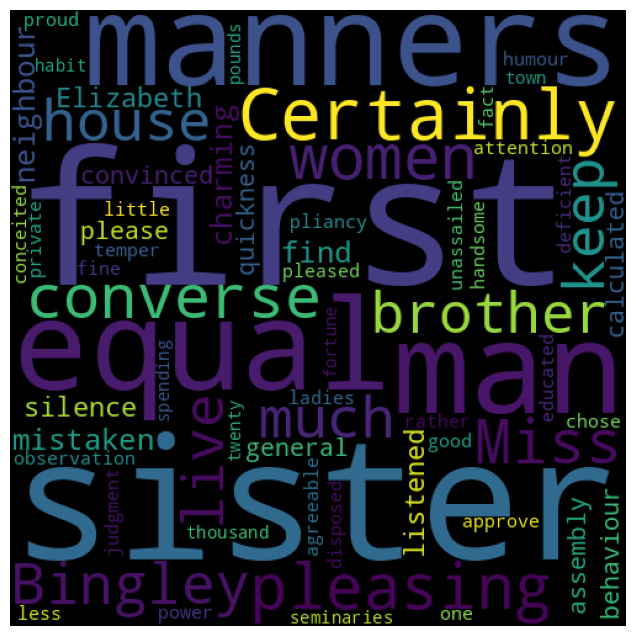

In [46]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [8, 8]

from wordcloud import WordCloud
t = ' '.join(better)
cloud = WordCloud(width = 500, height = 500).generate(t)
plt.imshow(cloud)
plt.axis('off')
plt.show()

In [47]:
import networkx as nx

graph = nx.DiGraph()
sequence = better.copy()

currentWord = sequence.pop(0)
while len(sequence) > 0:
  followingWord = sequence.pop(0)
  if graph.has_edge(currentWord, followingWord):
    graph[currentWord][followingWord]['weight'] += 1
  else:
    graph.add_edge(currentWord, followingWord, weight = 1)
  currentWord = followingWord

print(graph)

DiGraph with 69 nodes and 69 edges


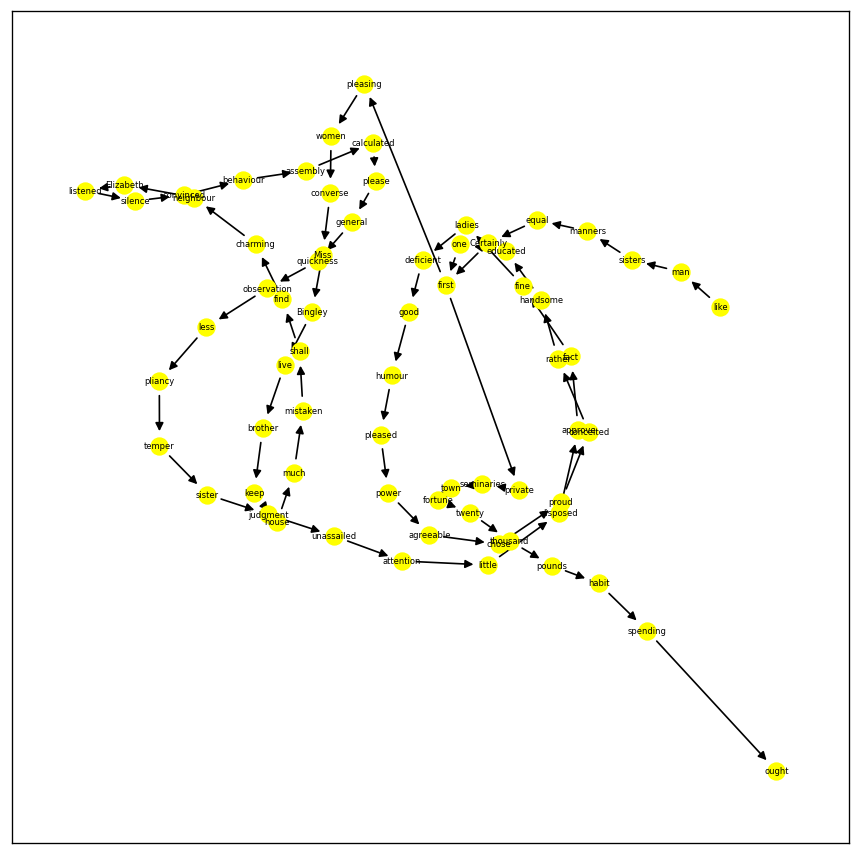

In [48]:
pos = nx.spring_layout(graph)
import matplotlib.pyplot as plt
fig = plt.figure(1, figsize = (9, 9), dpi =  120)
V = nx.draw_networkx_nodes(graph, pos, node_size = 100, node_color = 'yellow')

w = [ graph[u][v]['weight'] for u, v in graph.edges ]
E = nx.draw_networkx_edges(graph, pos, width = w)
vl = nx.draw_networkx_labels(graph, pos, font_size = 5)

In [25]:
from transformers import pipeline
sentiment_pipeline = pipeline(model = 'finiteautomata/bertweet-base-sentiment-analysis') # this will be SLOW and print out a lot of progress bars

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/949 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/540M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/338 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/843k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/540M [00:00<?, ?B/s]

bpe.codes:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/22.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/167 [00:00<?, ?B/s]

Device set to use cpu


In [49]:
inputs = [ 'This is great 😊 I got it as a gift and I absolutely love it, very useful.', 'This is the worst purchase I have ever made, total waste of money 😔']
outputs = sentiment_pipeline(inputs)

In [50]:
for (i, o) in zip(inputs, outputs):
  print(i, o)

This is great 😊 I got it as a gift and I absolutely love it, very useful. {'label': 'POS', 'score': 0.992657482624054}
This is the worst purchase I have ever made, total waste of money 😔 {'label': 'NEG', 'score': 0.9835191369056702}
